In [6]:
import numpy as np
from tqdm.notebook import tqdm
from PIL import Image
import matplotlib
import matplotlib.pyplot as plt
import cv2 as cv

import utils

In [7]:
# colors (manually picked)
LEAF = [119, 133, 110]
PETAL = [217, 219, 123]
STEM = [169, 178, 145]
FLOWER_COLORS = [LEAF, PETAL, STEM]

WALL1 = [135, 123, 108]
WALL2 = [196, 210, 218]
WALL3 = [164, 159, 156]
WALL4 = [90, 85, 74]
WALL_COLORS = [WALL1, WALL2, WALL3, WALL4]

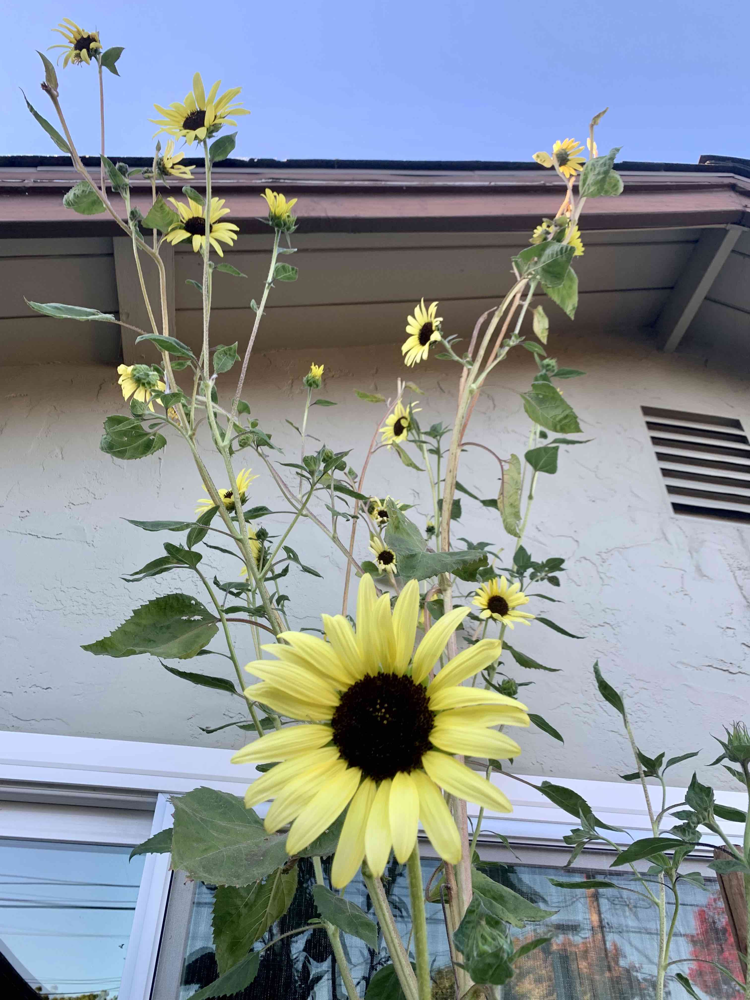

In [8]:
original = cv.imread("data/low_resolution_flower.jpg")
original = cv.cvtColor(original, cv.COLOR_BGR2RGB)  # converge BGR to RGB array
utils.display(original)

In [9]:
def get_min_color_distance(colors):
    distances = np.stack([np.linalg.norm(original - color, axis=2) for color in colors])
    return np.min(distances, axis=0)

min_flower_distances = get_min_color_distance(FLOWER_COLORS)
min_wall_distances = get_min_color_distance(WALL_COLORS)
flower_mask = min_flower_distances < min_wall_distances

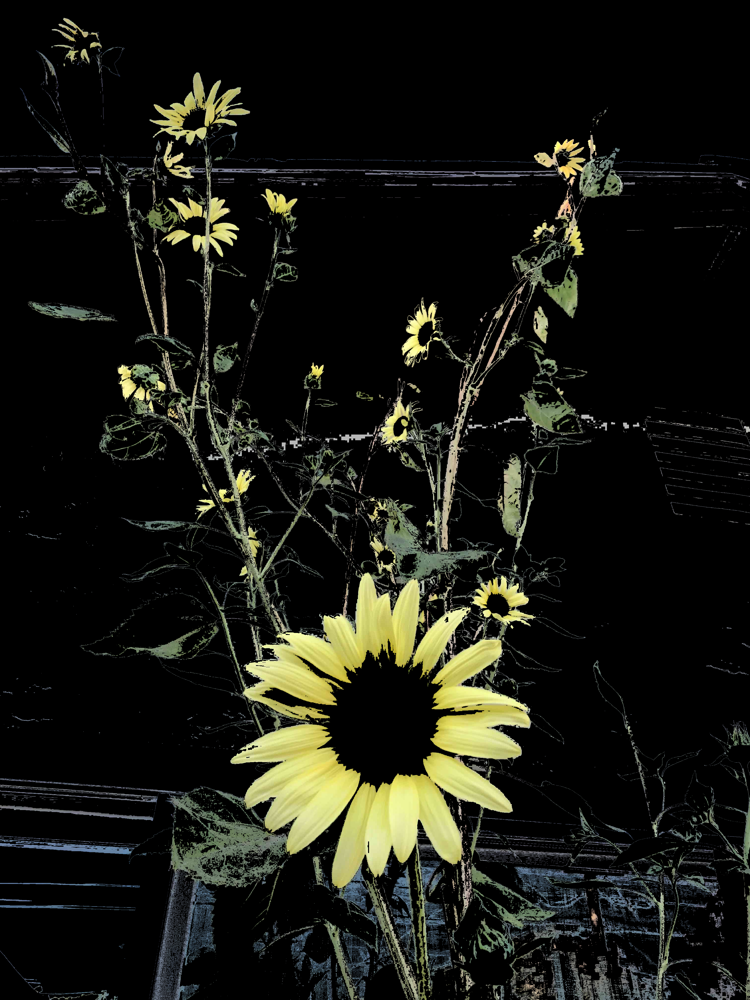

In [19]:
leaf_distance = np.linalg.norm(original - LEAF, axis=2)
masked = original.copy()
masked[~flower_mask] = 0
utils.display(masked)